In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split, GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn import tree
from sklearn.pipeline import Pipeline, make_pipeline

from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm

from xgboost import XGBClassifier

from icecream import ic

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv("../../data/BankChurners.csv")
print(f'There are {df.shape[0]} rows and {df.shape[1]} columns.')  # f-string

# I'm now going to look at 10 random rows
# I'm setting the random seed via np.random.seed so that
# I get the same random results every time
np.random.seed(2)
df.sample(n=10)

There are 10127 rows and 21 columns.


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
7862,711589758,Existing Customer,42,M,5,High School,Married,$60K - $80K,Blue,32,1,2,2,4162.0,1641,2521.0,0.719,3967,75,0.923,0.394
3536,717886008,Existing Customer,63,M,1,High School,Single,Less than $40K,Blue,51,5,3,2,6102.0,0,6102.0,0.639,4527,67,0.558,0.000
9770,720852108,Existing Customer,46,M,4,High School,Divorced,$120K +,Blue,31,2,3,1,3569.0,1553,2016.0,0.798,16695,116,0.681,0.435
8909,719785683,Existing Customer,41,M,4,Post-Graduate,Married,$80K - $120K,Blue,36,1,2,2,21751.0,1573,20178.0,0.878,8332,102,0.569,0.072
709,780054258,Existing Customer,40,M,5,Graduate,Unknown,$40K - $60K,Blue,25,6,2,3,7860.0,541,7319.0,0.764,1367,35,0.750,0.069
975,717180633,Existing Customer,59,M,1,Post-Graduate,Married,$40K - $60K,Blue,36,4,2,2,2483.0,1372,1111.0,1.642,1704,35,0.458,0.553
32,709029408,Existing Customer,41,M,4,Graduate,Married,$60K - $80K,Blue,36,4,1,2,8923.0,2517,6406.0,1.726,1589,24,1.667,0.282
9454,708510858,Existing Customer,60,F,1,Uneducated,Single,Less than $40K,Blue,47,1,3,2,4905.0,2413,2492.0,0.853,15478,109,0.730,0.492
4548,781297983,Existing Customer,58,M,2,Unknown,Divorced,$60K - $80K,Blue,52,6,2,3,20410.0,1196,19214.0,0.726,3525,78,0.733,0.059
9351,789983133,Existing Customer,31,M,2,Graduate,Unknown,$80K - $120K,Silver,22,2,3,2,34516.0,1780,32736.0,0.839,14185,98,0.690,0.052


#### Observations

- There are just over 10k rows and 21 attributes
- Looks like some variables will need one hot encoding.
- Let's convert the target variable to binary.

In [3]:
df.Attrition_Flag = df.Attrition_Flag.replace({'Attrited Customer':1,'Existing Customer':0})

What do the data types look like?

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  int64  
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

#### Observations

- The data types appear to make sense given the sample taken above.
- Going to do some one hot encoding later on:
    * Gender
    * Education_Level
    * Marital_Status
    * Income_Category
    * Card_Category

### Let's look at missing values

In [5]:
pd.DataFrame(
    data ={
        "% of Missing Values": round(df.isna().sum() / df.isna().count() * 100, 2)
    }
).sort_values(by="% of Missing Values", ascending=False)

,% of Missing Values
CLIENTNUM,0.0
Months_Inactive_12_mon,0.0
Total_Ct_Chng_Q4_Q1,0.0
Total_Trans_Ct,0.0
Total_Trans_Amt,0.0
Total_Amt_Chng_Q4_Q1,0.0
Avg_Open_To_Buy,0.0
Total_Revolving_Bal,0.0
Credit_Limit,0.0
Contacts_Count_12_mon,0.0


#### Observations

- Looks like the target variable 'Attrition_Flag' is good
- No others with missing values

### Let's look at unique values

In [6]:
df.nunique().sort_values(ascending=False)

CLIENTNUM                   10127
Avg_Open_To_Buy              6813
Credit_Limit                 6205
Total_Trans_Amt              5033
Total_Revolving_Bal          1974
Total_Amt_Chng_Q4_Q1         1158
Avg_Utilization_Ratio         964
Total_Ct_Chng_Q4_Q1           830
Total_Trans_Ct                126
Customer_Age                   45
Months_on_book                 44
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Education_Level                 7
Income_Category                 6
Dependent_count                 6
Total_Relationship_Count        6
Card_Category                   4
Marital_Status                  4
Attrition_Flag                  2
Gender                          2
dtype: int64

#### Observations

- Need to dump CLIENTNUM
- Highest cardinality with Avg_Open_To_Buy
- High cardinality in top 7 attributes
- Most other attributes have low cardinality

#### What does the product distribution look like from what's pitched?

In [7]:
df.groupby(['Card_Category', 'Attrition_Flag'])['Attrition_Flag'].count()

Card_Category  Attrition_Flag
Blue           0                 7917
               1                 1519
Gold           0                   95
               1                   21
Platinum       0                   15
               1                    5
Silver         0                  473
               1                   82
Name: Attrition_Flag, dtype: int64

#### Observations

Attrition Ranking for category owned & number of attrited:

Blue -> Silver -> Gold -> Platinum
     
It's clear that the blue card does the best in terms of volume, but it is also the one with the highest churn.

#### Let's look at Attrition _Rates.

In [8]:
df.groupby(['Card_Category'])['Attrition_Flag'].mean() * 100

Card_Category
Blue        16.097923
Gold        18.103448
Platinum    25.000000
Silver      14.774775
Name: Attrition_Flag, dtype: float64

The Attrition _Rates for card category tell a slightly different story in terms of ranking:

Platinum -> Gold -> Blue -> Silver

In [9]:
df.describe()

,CLIENTNUM,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,0.160660,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,0.367235,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,0.000000,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,0.000000,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,0.000000,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,0.000000,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,8.283431e+08,1.000000,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


Average utilization rate is a little on the higher side -> good would be under 20%.

In [131]:
#wholeReport = pandas_profiling.ProfileReport(df).to_file("wholeReport.html")
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/49 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Univariate Analysis
## Pandas-profiling Report Review

CLIENTNUM: Need to drop, record id.

Attrition_Flag: 16% churn.

Customer_Age: Normally distributed, though there's an odd spike around 50.

Gender: Split pretty evenly.

Dependent_count: Looks relatively normally distributed.

Education_Level: Customers seem relatively well educated at over 50% with higher education.

Marital_Status: Most customers are married, but single is a close second.

Income_Category: Most customers make less than $60k.

Card_Category: Blue is the largest category in terms of volume, with silver in second.

Months_on_book: Massive spike at 36 months, may need to deal with this.

Total_Relationship_Count: Flat from 3+, maybe not useful.

Months_Inactive_12_mon: Spike in 1,2,3 - may want to look into more.

Contacts_Count_12_mon: Seems normally distributed, but there are a lot of individuals with 0 contacts at ~4%

Credit_Limit: Unusual number of individuals with a high credit limit (~34k)

Total_Revolving_Bal: Most people keep a revolving balance of 0, spike at $2500. Otherwise distribution looks okay.

Avg_Open_To_Buy: Significant right skewness at 1.66, should take logs.

Total_Amt_Chng_Q4_Q1: Going to look into outliers here.

Total_Trans_Amt: Looks like there are groups of observations here, may want to split into bins.

Total_Trans_Ct: Looks like there are groups of observations here, may want to split into bins.

Total_Ct_Chng_Q4_Q1: Going to look into outliers here.

Avg_Utilization_Ratio: Most utilization is 0, which makes sense given the number of people that maintain a balance of 0.


## Let's clean up the gender variable, then drop a few unnecessary columns.

In [11]:
df.Gender = df.Gender.replace({'M':1,'F':0})
df.drop('CLIENTNUM', axis=1, inplace=True)

## Run some one hot encoding

In [12]:
ohe_list = [['Education_Level'],['Marital_Status'],['Income_Category'],['Card_Category']]
for att in ohe_list:
    df = pd.concat([df,pd.get_dummies(df[att].astype(str), drop_first=True)],axis=1)

# Bivariate Analysis

In [13]:
#Create a data frame to work with just converted customers
dat_analysis = df[df['Attrition_Flag']==1]

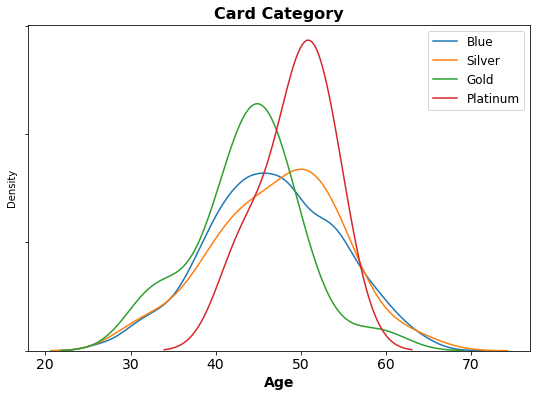

In [14]:
fig = plt.figure(figsize=[9,6]);
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Blue','Customer_Age'], kde=True, hist=False, label='Blue');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Silver','Customer_Age'], kde=True, hist=False, label='Silver');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Gold','Customer_Age'], kde=True, hist=False, label='Gold');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Platinum','Customer_Age'], kde=True, hist=False, label='Platinum');
plt.yticks(np.arange(0,0.12,0.03),labels=['','','','']);
plt.xticks(fontsize=14)
plt.xlabel('Age', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Category', fontsize=16, fontweight='bold');

- Blue distribution mainly in the pretty varied, which makes sense given number of customers.
- Silver distribution relatively similar to Blue.
- Gold a little more focused in the 40-50 range.
- Platinum slightly left skewed, with many in the late 40s to mid 50s.

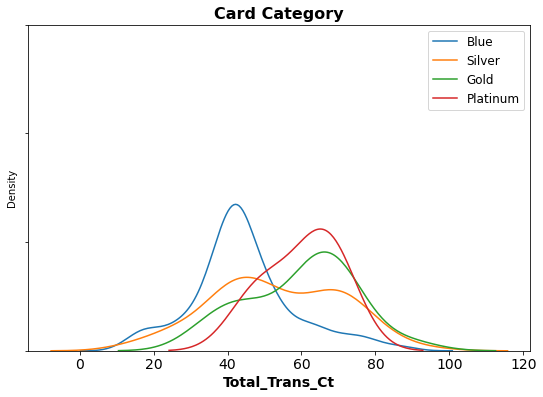

In [15]:
fig = plt.figure(figsize=[9,6]);
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Blue','Total_Trans_Ct'], kde=True, hist=False, label='Blue');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Silver','Total_Trans_Ct'], kde=True, hist=False, label='Silver');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Gold','Total_Trans_Ct'], kde=True, hist=False, label='Gold');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Platinum','Total_Trans_Ct'], kde=True, hist=False, label='Platinum');
plt.yticks(np.arange(0,0.12,0.03),labels=['','','','']);
plt.xticks(fontsize=14)
plt.xlabel('Total_Trans_Ct', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Category', fontsize=16, fontweight='bold');

- Transaction counts are higher with gold and platinum
- Lower transaction counts with blue.

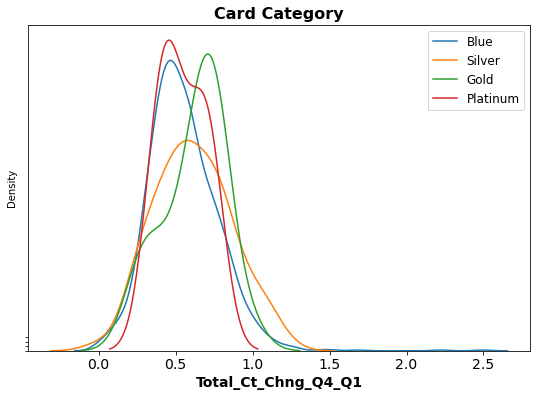

In [16]:
fig = plt.figure(figsize=[9,6]);
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Blue','Total_Ct_Chng_Q4_Q1'], kde=True, hist=False, label='Blue');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Silver','Total_Ct_Chng_Q4_Q1'], kde=True, hist=False, label='Silver');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Gold','Total_Ct_Chng_Q4_Q1'], kde=True, hist=False, label='Gold');
sns.distplot(dat_analysis.loc[dat_analysis['Card_Category'] == 'Platinum','Total_Ct_Chng_Q4_Q1'], kde=True, hist=False, label='Platinum');
plt.yticks(np.arange(0,0.12,0.03),labels=['','','','']);
plt.xticks(fontsize=14)
plt.xlabel('Total_Ct_Chng_Q4_Q1', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Category', fontsize=16, fontweight='bold');

- Distributions pretty similar across categories, with silvers change count slightly lower and wider than the rest.

- Basic and deluxe outperforms across all marital status types.
- Standard does relatively well, does best with married status.
- Super deluxe and king underperform with divorced and unmarried.

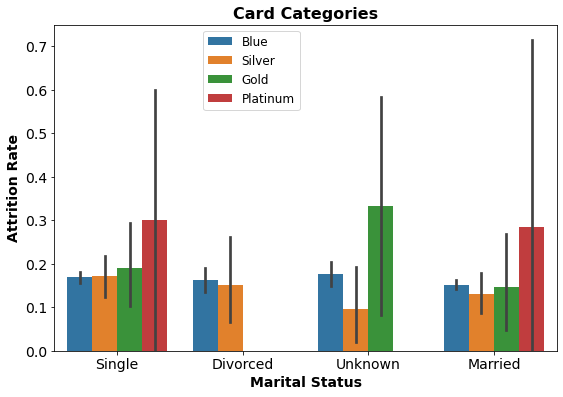

In [17]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Marital_Status', y='Attrition_Flag', hue='Card_Category', order=['Single','Divorced','Unknown','Married'],hue_order=['Blue','Silver','Gold','Platinum'])
plt.xticks(fontsize=14);
plt.xlabel('Marital Status', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12, bbox_to_anchor=(0.5,1));
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Attrition rate is highest for platinum among single and married, the other categories perform comparably.
- Gold is highest for unknown category

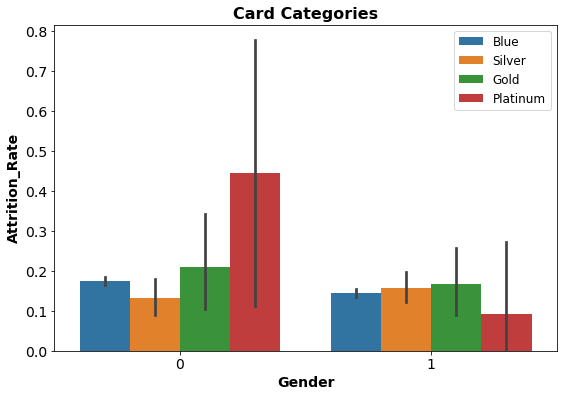

In [18]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Gender', y='Attrition_Flag', hue='Card_Category', hue_order=['Blue','Silver','Gold','Platinum']);
plt.xticks([0,1],fontsize=14);
plt.xlabel('Gender', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition_Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Females attrit churn at a higher rate for every category, aside from silver.
- They are significantly higher for the platinum category.

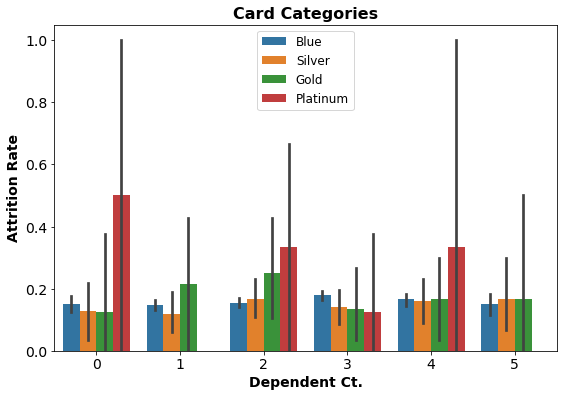

In [19]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Dependent_count', y='Attrition_Flag', hue='Card_Category', hue_order=['Blue','Silver','Gold','Platinum']);
plt.xticks(fontsize=14);
plt.xlabel('Dependent Ct.', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Platinum frequently has a relatively high attrition rate for 0, 2, and 4 kid families.
- Gold does poorly with families that have 1 or two kids.
- In general, blue and silver perform comparably.

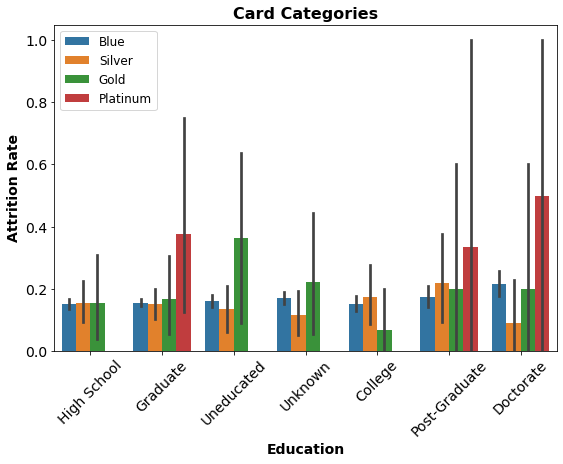

In [20]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Education_Level', y='Attrition_Flag', hue='Card_Category', hue_order=['Blue','Silver','Gold','Platinum']);
plt.xticks(fontsize=14, rotation=45);
plt.xlabel('Education', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Highly educated individuals tend to attrit on the platinum category a lot, suggests more informed customers don't think highly of it.
- Uneducated and unknown don't appear to think much of the gold category.
- Blue and silver perform relatively consistently across education level.

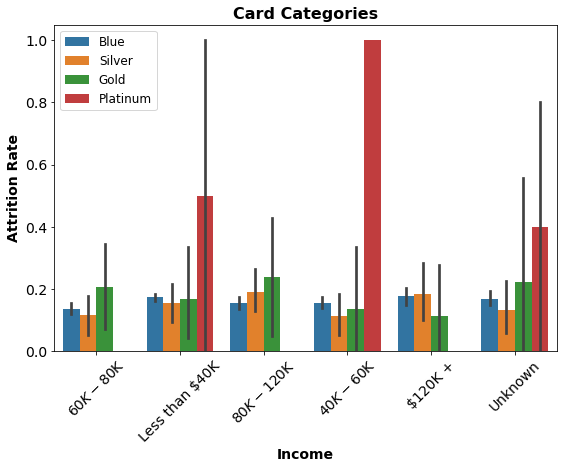

In [21]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Income_Category', y='Attrition_Flag', hue='Card_Category', hue_order=['Blue','Silver','Gold','Platinum']);
plt.xticks(fontsize=14, rotation=45);
plt.xlabel('Income', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Platinum again doesn't do well against certain levels of this dimension, with low or unknown income levels attriting at a very high rate.
- Higher income individuals don't appear to have churn on platinum and are moderately consistent across other categories.

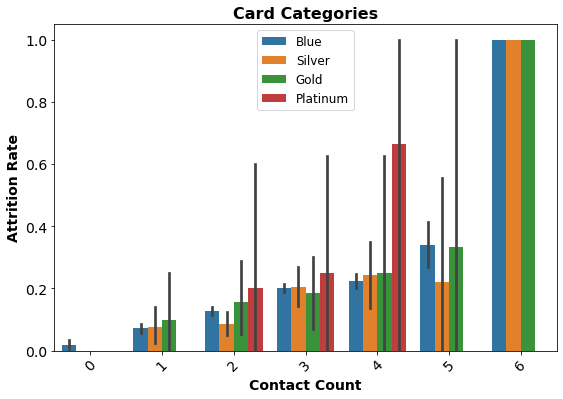

In [22]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Contacts_Count_12_mon', y='Attrition_Flag', hue='Card_Category', hue_order=['Blue','Silver','Gold','Platinum']);
plt.xticks(fontsize=14, rotation=45);
plt.xlabel('Contact Count', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Everyone with 6 contacts in the blue, silver, and gold category attrits, this seems unusual.
- Platinum is highest for 2-4 contacts.
- Overall there appears to be a monotonic relationship between the number of contacts and the attrition rate.

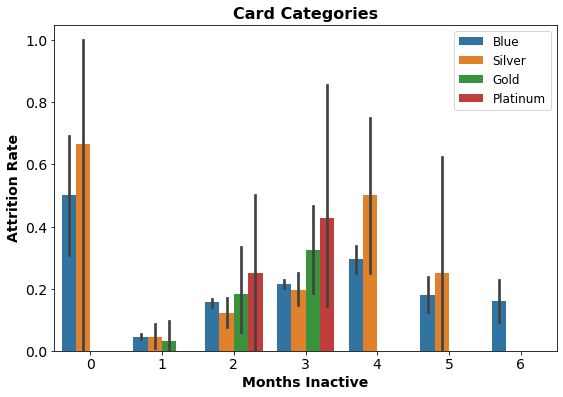

In [23]:
fig = plt.figure(figsize=[9,6]);
sns.barplot(data=df, x='Months_Inactive_12_mon', y='Attrition_Flag', hue='Card_Category', hue_order=['Blue','Silver','Gold','Platinum']);
plt.xticks(fontsize=14);
plt.xlabel('Months Inactive', fontsize=14, fontweight='bold');
plt.yticks(fontsize=14);
plt.ylabel('Attrition Rate', fontsize=14, fontweight='bold');
plt.legend(fontsize=12);
plt.title('Card Categories', fontsize=16, fontweight='bold');

- Only customers without inactivity attrit in the blue and silver categories.
- For other categories it peaks around 4 months.
- My guess is if you looked at a cumulative distribution plot it probably starts to flatten around 3_4 months, which suggests that if they make it past 4 months they more than likely won't.

In [24]:
# Frequency
stats_df = df \
.groupby('Months_Inactive_12_mon') \
['Attrition_Flag'] \
.agg('count') \
.pipe(pd.DataFrame) \
.rename(columns = {'Attrition_Flag': 'frequency'})

# PDF
stats_df['pdf'] = stats_df['frequency'] / sum(stats_df['frequency'])

# CDF
stats_df['cdf'] = stats_df['pdf'].cumsum()
stats_df = stats_df.reset_index()
stats_df

,Months_Inactive_12_mon,frequency,pdf,cdf
0,0,29,0.002864,0.002864
1,1,2233,0.220500,0.223363
2,2,3282,0.324084,0.547447
3,3,3846,0.379777,0.927224
4,4,435,0.042954,0.970179
5,5,178,0.017577,0.987756
6,6,124,0.012244,1.000000


<AxesSubplot:xlabel='Months_Inactive_12_mon'>

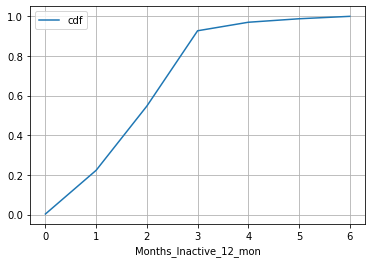

In [25]:
stats_df.plot(x = 'Months_Inactive_12_mon', y = ['cdf'], grid = True)

We can confirm visually here that the marginal propensity to attrit flattens around the 3-4 month mark.

## Feature Engineering

### Take logs to deal with some of the attribute skewness

In [26]:
df.Credit_Limit = np.log(df['Credit_Limit'])
df.Total_Ct_Chng_Q4_Q1 = np.log(df['Total_Ct_Chng_Q4_Q1'])
df.Total_Amt_Chng_Q4_Q1 = np.log(df['Total_Amt_Chng_Q4_Q1'])
df.Avg_Open_To_Buy = np.log(df['Avg_Open_To_Buy'])

### Other transformations

Going to convert total transaction amount and count to categorical, since observations appear to be clustered around certain levels.

In [27]:
def amtBin(x):
    if 0 < x <= 3000:
        return 'low'
    elif 3000 < x <= 5000:
        return 'medium'
    elif 5000 < x <= 12000:
        return 'high'
    else:
        return 'highest'

def ctBin(x):
    if 0 < x <= 50:
        return 'low'
    elif 50 < x <= 100:
        return 'medium'
    else:
        return 'high'

df['TTA_BINS'] = df['Total_Trans_Amt'].apply(amtBin)
df['TTC_BINS'] = df['Total_Trans_Ct'].apply(ctBin)

Next, OHE the newly created categories.

In [28]:
ohe_list = [['TTA_BINS', 'TTC_BINS']]
for att in ohe_list:
    df = pd.concat([df,pd.get_dummies(df[att].astype(str), drop_first=True)],axis=1)

Check the data and drop unneccessary columns.

In [29]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,TTA_BINS,TTC_BINS,TTA_BINS_highest,TTA_BINS_low,TTA_BINS_medium,TTC_BINS_low,TTC_BINS_medium
0,0,45,1,3,High School,Married,$60K - $80K,Blue,39,5,1,3,9.448648,777,9.385469,0.288931,1144,42,0.485508,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,low,low,0,1,0,1,0
1,0,49,0,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,9.018695,864,8.908154,0.432432,1291,33,1.312109,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,low,low,0,1,0,1,0
2,0,51,1,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,8.136811,0,8.136811,0.953201,1887,20,0.847155,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,low,low,0,1,0,1,0
3,0,40,0,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,8.105609,2517,6.679599,0.340037,1171,20,0.847155,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,low,low,0,1,0,1,0
4,0,40,1,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,8.458716,0,8.458716,0.777029,816,28,0.916291,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,low,low,0,1,0,1,0


In [30]:
df = df.reset_index()

In [31]:
df.drop(['TTA_BINS', 'Total_Trans_Amt', 'TTC_BINS', 'Total_Trans_Ct','Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'index'], axis=1, inplace=True)

Going to drop a few records that have missing values.

In [32]:
#Get rid of a few NaN values
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

dfs = clean_dataset(df)

In [33]:
print(f'There are {dfs.shape[0]} rows and {dfs.shape[1]} columns.')  # f-string

There are 10120 rows and 36 columns.


Only 7 records dropped - this is a marginal amount of lost information.

## Split Data

In [34]:
x = dfs.drop(["Attrition_Flag"], axis=1)
y = dfs["Attrition_Flag"]

In [35]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3 , random_state=7,stratify=y)

In [36]:
y.value_counts(1)

0.0    0.839921
1.0    0.160079
Name: Attrition_Flag, dtype: float64

In [37]:
y_train.value_counts(1)

0.0    0.839921
1.0    0.160079
Name: Attrition_Flag, dtype: float64

# Define some functions

### Model scoring

In [38]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    train_rocAuc = roc_auc_score(y_train, pred_train)
    test_rocAuc = roc_auc_score(y_test, pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision, train_rocAuc, test_rocAuc))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
        print('ROC-AUC Score on train data:',metrics.roc_auc_score(y_train, pred_train))
        print('ROC-AUC Score on test data:',metrics.roc_auc_score(y_test, pred_test))
    
    return score_list # returning the list with train and test scores

### Confusion Matrix

In [39]:
### Function to make confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Model Building

<br>
<br>
For this analysis, we're going to assume that the cost of losing a customer is high and that there aren't associated marketing costs since the org is going to work on services.  As such the focus will be on recall and ROC-AUC.

## Model 1 - Logistic Regression

In [40]:
lr = LogisticRegression(random_state=1)
lr.fit(X_train,y_train)

LogisticRegression(random_state=1)

**Let's evaluate the model performance by using KFold and cross_val_score**

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

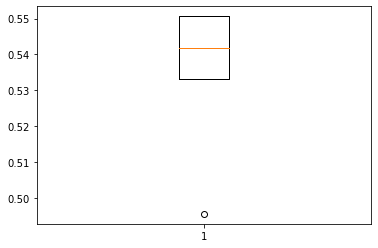

In [41]:
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv_result_bfr=cross_val_score(estimator=lr, X=X_train, y=y_train, scoring=scoring, cv=kfold)
#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

Accuracy on training set :  0.8993506493506493
Accuracy on test set :  0.900197628458498
Recall on training set :  0.5617283950617284
Recall on test set :  0.5925925925925926
Precision on training set :  0.7467760844079718
Precision on test set :  0.732824427480916
ROC-AUC Score on train data: 0.7627129370266625
ROC-AUC Score on test data: 0.7757080610021787


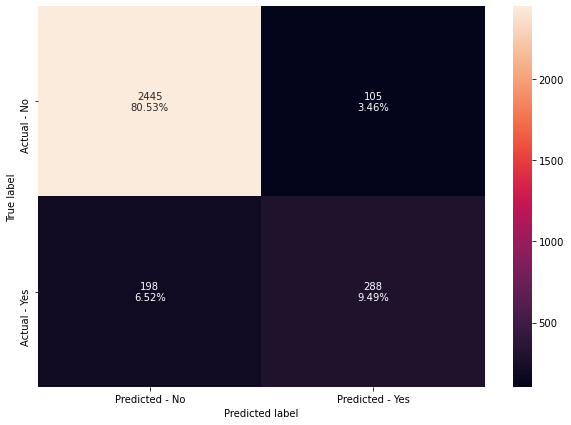

In [42]:
#Calculating different metrics
scores_LR = get_metrics_score(lr)

# creating confusion matrix
make_confusion_matrix(lr,y_test)

Update


* Logistic Regression has given a generalized performance on training and test set.
* Recall isn't great, let's see if the model performance can be further improved by:

  a) Oversampling - getting more data points for the minority class.
  
  b) Undersampling - dealing with the class imbalance.

### Oversampling train data using SMOTE

In [43]:
from imblearn.over_sampling import SMOTE

In [44]:
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train==1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train==0)))

sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over==1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over==0)))


print('After UpSampling, the shape of train_X: {}'.format(X_train_over.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 1134
Before UpSampling, counts of label 'No': 5950 

After UpSampling, counts of label 'Yes': 5950
After UpSampling, counts of label 'No': 5950 

After UpSampling, the shape of train_X: (11900, 35)
After UpSampling, the shape of train_y: (11900,) 



### Logistic Regression on oversampled data

In [45]:
log_reg_over = LogisticRegression(random_state = 1)

# Training the basic logistic regression model with training set 
log_reg_over.fit(X_train_over,y_train_over)

LogisticRegression(random_state=1)

**Let's evaluate the model performance by using KFold and cross_val_score**

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

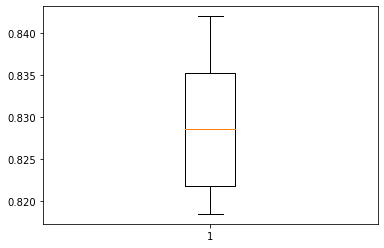

In [46]:
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv_result_over=cross_val_score(estimator=log_reg_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold)
#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_over)
plt.show()

Need to update

* Performance on training set varies between 0.825 to 0.835 recall.
* Let's check the performance on test data.

Accuracy on training set :  0.8234048560135516
Accuracy on test set :  0.8129117259552042
Recall on training set :  0.8059964726631393
Recall on test set :  0.8189300411522634
Precision on training set :  0.4699228791773779
Precision on test set :  0.4533029612756264
ROC-AUC Score on train data: 0.8163595808693848
ROC-AUC Score on test data: 0.8153473735173081


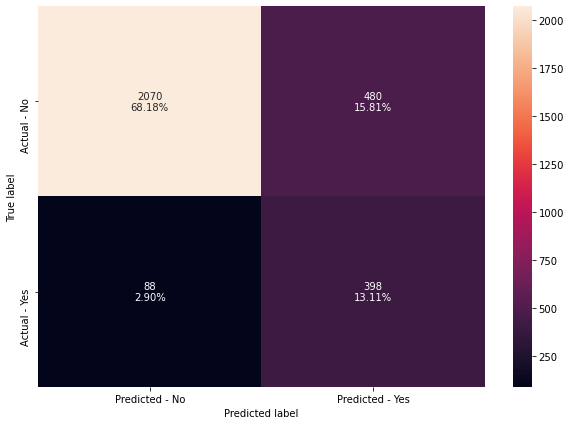

In [47]:
#Calculating different metrics
get_metrics_score(log_reg_over)

# creating confusion matrix
make_confusion_matrix(log_reg_over,y_test)

* Recall has significantly improved.
* Let's see if regularization/tuning can make the model performance better.

### Regularization

In [48]:
# Choose the type of classifier. 
lr_estimator = LogisticRegression(random_state=1,solver='saga')

# Grid of parameters to choose from
parameters = {'C': np.arange(0.1,1.1,0.1)}

# Run the grid search
grid_obj = GridSearchCV(lr_estimator, parameters, scoring='recall')
grid_obj = grid_obj.fit(X_train_over, y_train_over)

# Set the clf to the best combination of parameters
lr_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
lr_estimator.fit(X_train_over, y_train_over)

LogisticRegression(C=0.1, random_state=1, solver='saga')

Accuracy on training set :  0.7241671372106154
Accuracy on test set :  0.7292490118577075
Recall on training set :  0.708994708994709
Recall on test set :  0.7489711934156379
Precision on training set :  0.3311367380560132
Precision on test set :  0.34210526315789475
ROC-AUC Score on train data: 0.7180267662620603
ROC-AUC Score on test data: 0.7372306947470346


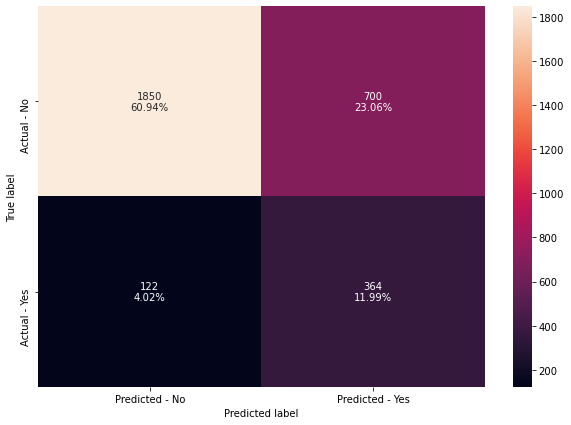

In [49]:
#Calculating different metrics
get_metrics_score(lr_estimator)

# creating confusion matrix
make_confusion_matrix(lr_estimator,y_test)

* Model performance hasn't improved after regularization.

### Undersampling train data using SMOTE

In [50]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state = 1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [51]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train==1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train==0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un==1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un==0)))

print('After Under Sampling, the shape of train_X: {}'.format(X_train_un.shape))
print('After Under Sampling, the shape of train_y: {} \n'.format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 1134
Before Under Sampling, counts of label 'No': 5950 

After Under Sampling, counts of label 'Yes': 1134
After Under Sampling, counts of label 'No': 1134 

After Under Sampling, the shape of train_X: (2268, 35)
After Under Sampling, the shape of train_y: (2268,) 



### Logistic Regression on undersampled data

**Let's evaluate the model performance by using KFold and cross_val_score**

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

In [52]:
log_reg_under = LogisticRegression(random_state = 1)
log_reg_under.fit(X_train_un,y_train_un )

LogisticRegression(random_state=1)

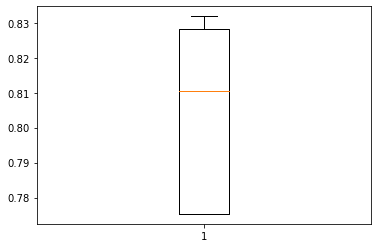

In [53]:
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv_result_under=cross_val_score(estimator=log_reg_under, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold)
#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_under)
plt.show()

* Performance of model on training set varies between 0.775 to 0.83.
* Let's check the performance on the test set.

Accuracy on training set :  0.8167701863354038
Accuracy on test set :  0.8115942028985508
Recall on training set :  0.8165784832451499
Recall on test set :  0.8271604938271605
Precision on training set :  0.4593253968253968
Precision on test set :  0.451685393258427
ROC-AUC Score on train data: 0.8166926029671128
ROC-AUC Score on test data: 0.8178939724037764


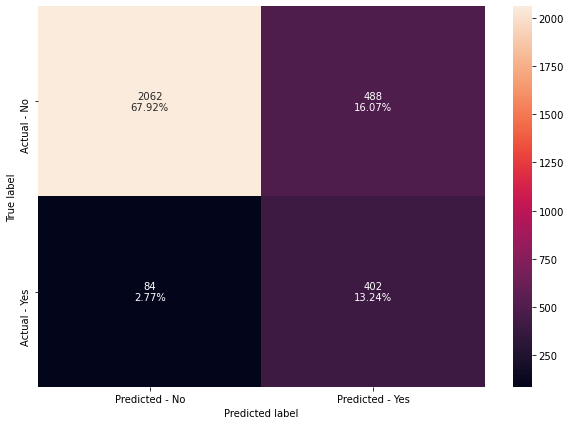

In [54]:
#Calculating different metrics
get_metrics_score(log_reg_under)


# creating confusion matrix
make_confusion_matrix(log_reg_under,y_test)

* Model has given a generalized performance on training and test set.
* Model performance improved significantly using downsampling, even moreso than upsampling.

In [94]:
# defining list of model
models = [lr]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
roc_auc_train = []
roc_auc_test = []

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8993506493506493
Accuracy on test set :  0.900197628458498
Recall on training set :  0.5617283950617284
Recall on test set :  0.5925925925925926
Precision on training set :  0.7467760844079718
Precision on test set :  0.732824427480916
ROC-AUC Score on train data: 0.7627129370266625
ROC-AUC Score on test data: 0.7757080610021787


In [95]:
# defining list of models
models = [log_reg_over, lr_estimator]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8234048560135516
Accuracy on test set :  0.8129117259552042
Recall on training set :  0.8059964726631393
Recall on test set :  0.8189300411522634
Precision on training set :  0.4699228791773779
Precision on test set :  0.4533029612756264
ROC-AUC Score on train data: 0.8163595808693848
ROC-AUC Score on test data: 0.8153473735173081
Accuracy on training set :  0.7241671372106154
Accuracy on test set :  0.7292490118577075
Recall on training set :  0.708994708994709
Recall on test set :  0.7489711934156379
Precision on training set :  0.3311367380560132
Precision on test set :  0.34210526315789475
ROC-AUC Score on train data: 0.7180267662620603
ROC-AUC Score on test data: 0.7372306947470346


In [96]:
# defining list of model
models = [log_reg_under]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8167701863354038
Accuracy on test set :  0.8115942028985508
Recall on training set :  0.8165784832451499
Recall on test set :  0.8271604938271605
Precision on training set :  0.4593253968253968
Precision on test set :  0.451685393258427
ROC-AUC Score on train data: 0.8166926029671128
ROC-AUC Score on test data: 0.8178939724037764


In [97]:
comparison_frame = pd.DataFrame({'Model':['Logistic Regression','Logistic Regression on Oversampled data',
                                          'Logistic Regression-Regularized (Oversampled data)','Logistic Regression on Undersampled data'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_ROC/AUC':roc_auc_train,'Test_ROC/AUC':roc_auc_test}) 

#Sorting models in decreasing order of test recall
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_ROC/AUC,Test_ROC/AUC
0,Logistic Regression,0.899351,0.900198,0.561728,0.592593,0.746776,0.732824,0.762713,0.775708
1,Logistic Regression on Oversampled data,0.823405,0.812912,0.805996,0.818930,0.469923,0.453303,0.816360,0.815347
2,Logistic Regression-Regularized (Oversampled d...,0.724167,0.729249,0.708995,0.748971,0.331137,0.342105,0.718027,0.737231
3,Logistic Regression on Undersampled data,0.816770,0.811594,0.816578,0.827160,0.459325,0.451685,0.816693,0.817894


We've been able to significantly improve the performance of the model with up / down - sampling.  Undersampled data is the top performer in the logistic regression models.

### Model 2 - Bagging Classifier

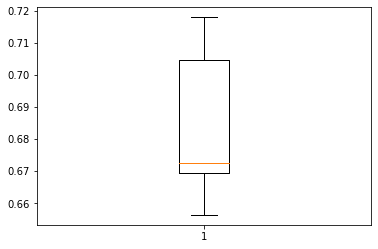

In [59]:
#initialize bagging classifier solver
bc = BaggingClassifier(random_state=42)
bc.fit(X_train, y_train)

#CV code
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv=cross_val_score(estimator=bc, X=X_train, y=y_train, scoring=scoring, cv=kfold)

#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv)
plt.show()


* Performance of model on training set varies between 0.875 to 0.91.
* Let's check the performance on the test set.

Accuracy on training set :  0.9929418407679277
Accuracy on test set :  0.930171277997365
Recall on training set :  0.9620811287477954
Recall on test set :  0.7098765432098766
Precision on training set :  0.9936247723132969
Precision on test set :  0.8293269230769231
ROC-AUC Score on train data: 0.9804523290797801
ROC-AUC Score on test data: 0.8410167029774873


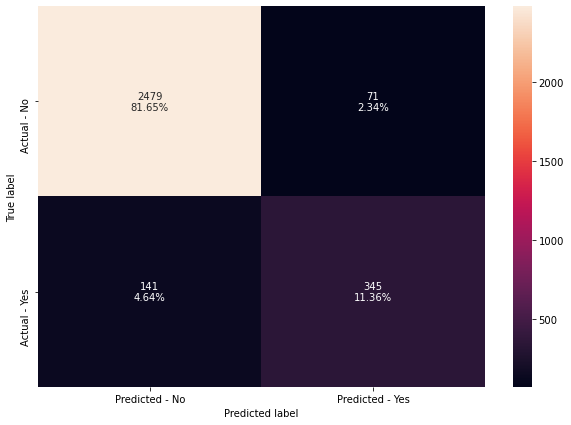

In [60]:
#Calculating different metrics
scores_bc = get_metrics_score(bc)

#Creating confusion matrix
make_confusion_matrix(bc,y_test)

* Model has slightly overfits.
* Recall on test is pretty good.

### Model 3 - Random Forest

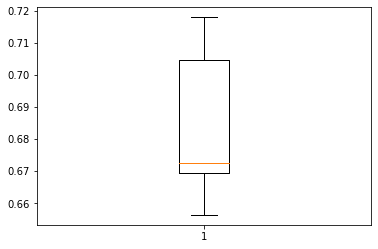

In [61]:
# Choose the type of classifier. 
rf = RandomForestClassifier(random_state=1)

# Fit the best algorithm to the data. 
rf.fit(X_train, y_train)

#CV code
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv=cross_val_score(estimator=bc, X=X_train, y=y_train, scoring=scoring, cv=kfold)

#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv)
plt.show()

* Recall is between ~.878 and .91
* Let's check the performance on the test set.

Accuracy on training set :  1.0
Accuracy on test set :  0.9357707509881423
Recall on training set :  1.0
Recall on test set :  0.6954732510288066
Precision on training set :  1.0
Precision on test set :  0.8779220779220779
ROC-AUC Score on train data: 1.0
ROC-AUC Score on test data: 0.8385209392398935


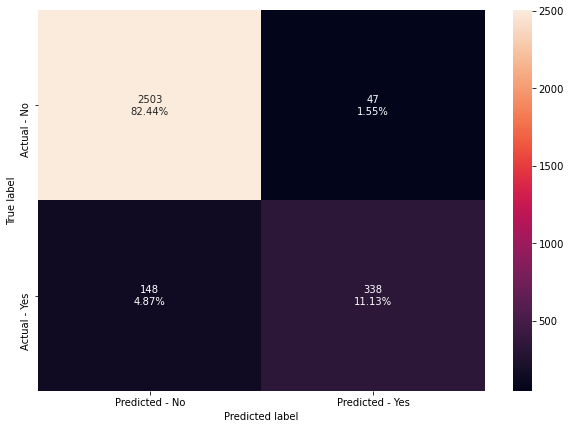

In [62]:
#Calculating different metrics
get_metrics_score(rf)

#Creating confusion matrix
make_confusion_matrix(rf,y_test)

* Model overfits.
* Recall not as good as earlier models.

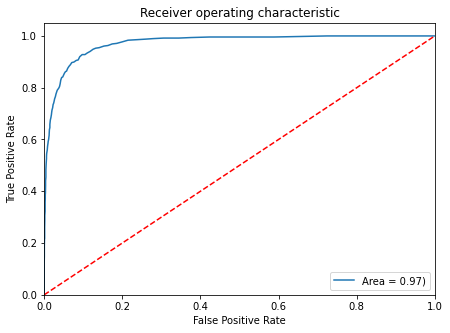

In [63]:
roc_auc_test = roc_auc_score(y_test, rf.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, rf.predict_proba(X_test)[:,1])
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label='Area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

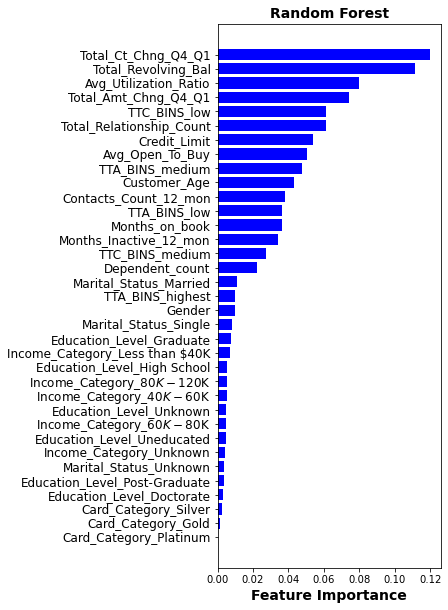

In [64]:
feature_names = X_train.columns
importances = rf.feature_importances_
indices = np.argsort(importances)
fig=plt.figure(figsize=[4,10]);
plt.title('Random Forest', fontsize=14, fontweight='bold');
plt.barh(range(len(indices)), importances[indices], align='center', color='Blue');
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize=12);
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold');

## Model 4 - Decision Tree w/ Pruning

In [65]:
# Choose the type of classifier. 
dt = DecisionTreeClassifier(random_state=1)

# Fit the best algorithm to the data. 
dt.fit(X_train, y_train)


DecisionTreeClassifier(random_state=1)

Accuracy on training set :  1.0
Accuracy on test set :  0.8942687747035574
Recall on training set :  1.0
Recall on test set :  0.7098765432098766
Precision on training set :  1.0
Precision on test set :  0.6571428571428571
ROC-AUC Score on train data: 1.0
ROC-AUC Score on test data: 0.8196441539578795


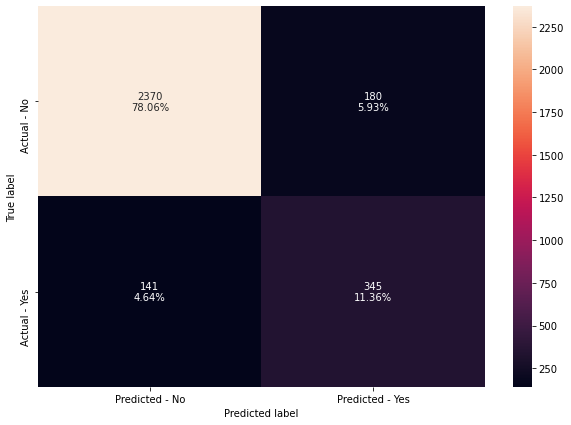

In [66]:
#Calculating different metrics
get_metrics_score(dt)

#Creating confusion matrix
make_confusion_matrix(dt,y_test)

* Model overfits.
* Recall not as good as earlier models.

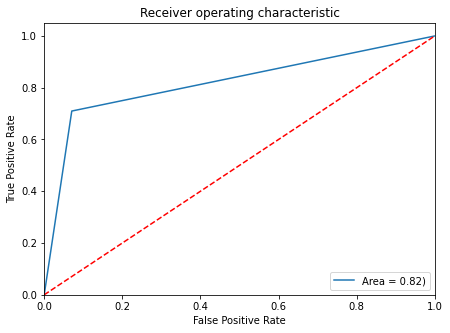

In [67]:
roc_auc_test = roc_auc_score(y_test, dt.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, dt.predict_proba(X_test)[:,1])
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label='Area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

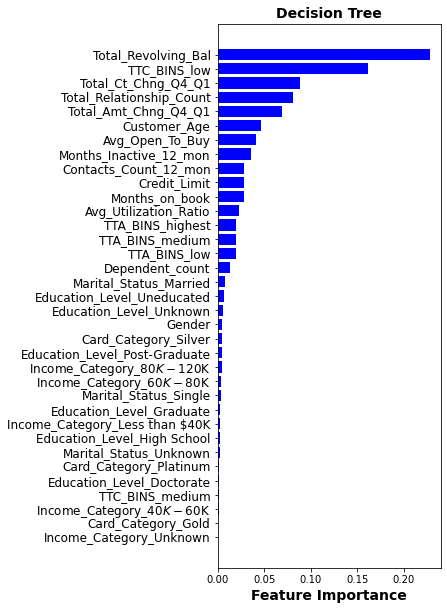

In [68]:
feature_names = X_train.columns
importances = dt.feature_importances_
indices = np.argsort(importances)
fig=plt.figure(figsize=[4,10]);
plt.title('Decision Tree', fontsize=14, fontweight='bold');
plt.barh(range(len(indices)), importances[indices], align='center', color='Blue');
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize=12);
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold');

- Top atts are revolving balance, total transaction count low, change in total transaction count, and total relationship count.

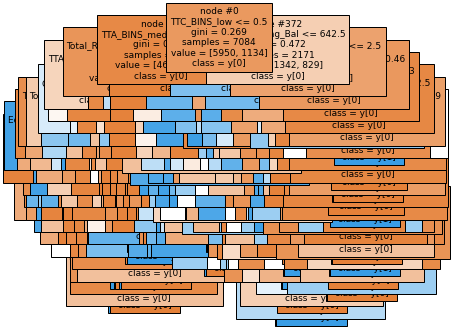

In [69]:
column_names = list(X_train.columns)
feature_names = column_names

plt.figure(figsize=(5,5))

tree.plot_tree(dt,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

- Too many nodes

In [70]:
clf = DecisionTreeClassifier(random_state=1)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

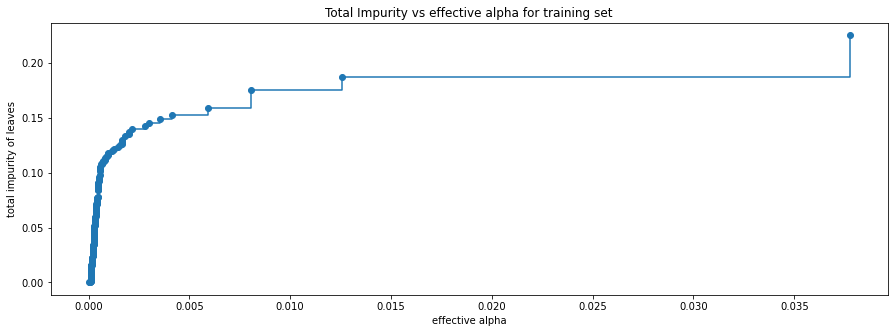

In [71]:
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

Next, we train a decision tree using the effective alphas. The last value in ``ccp_alphas`` is the alpha value that prunes the whole tree, leaving the tree, ``clfs[-1]``, with one node.

In [72]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.04346692803129576


For the remainder, we remove the last element in ``clfs`` and ``ccp_alphas``, because it is the trivial tree with only one
node. Here we show that the number of nodes and tree depth decreases as alpha increases.

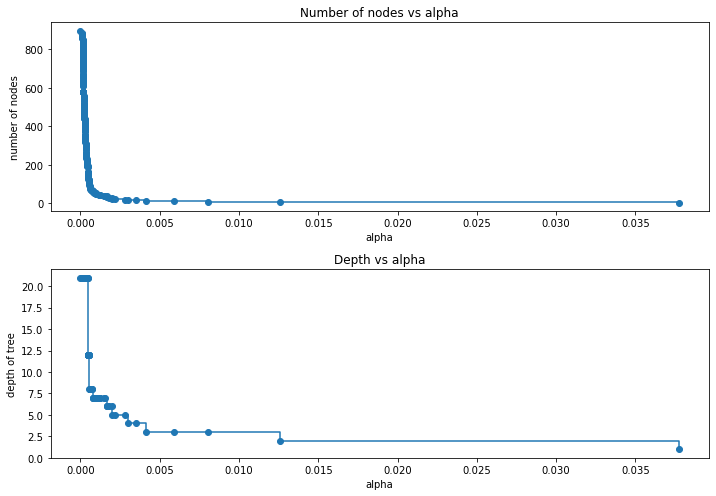

In [73]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1,figsize=(10,7))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

Recall vs alpha for training and testing sets
----------------------------------------------------

In [74]:
recall_train=[]
for clf in clfs:
    pred_train3=clf.predict(X_train)
    values_train=metrics.recall_score(y_train,pred_train3)
    recall_train.append(values_train)

In [75]:
recall_test=[]
for clf in clfs:
    pred_test3=clf.predict(X_test)
    values_test=metrics.recall_score(y_test,pred_test3)
    recall_test.append(values_test)

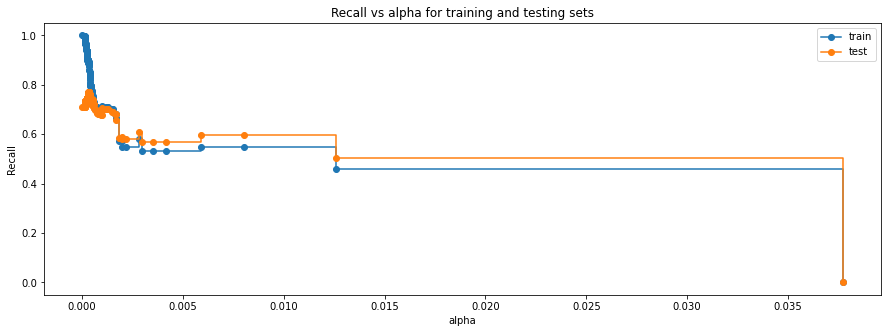

In [76]:
fig, ax = plt.subplots(figsize=(15,5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [77]:
# creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
dtree = clfs[index_best_model]
print(index_best_model)

130


Accuracy on training set :  0.9695087521174478
Accuracy on test set :  0.919631093544137
Recall on training set :  0.890652557319224
Recall on test set :  0.7695473251028807
Precision on training set :  0.9165154264972777
Precision on test set :  0.7391304347826086
ROC-AUC Score on train data: 0.9375951862226372
ROC-AUC Score on test data: 0.8588913096102639


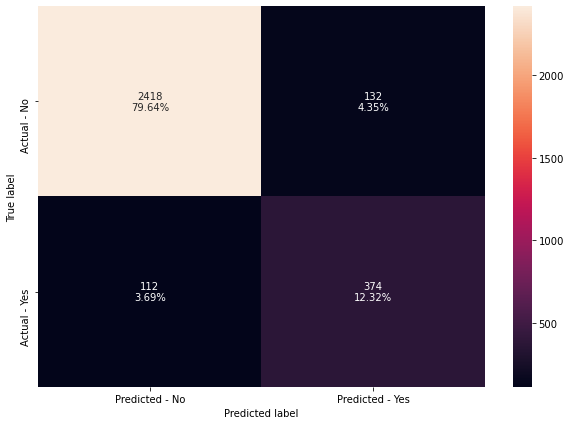

In [78]:
#Calculating different metrics
get_metrics_score(dtree)

#Creating confusion matrix
make_confusion_matrix(dtree,y_test)

* Model overfits.
* Recall not as good as earlier models.

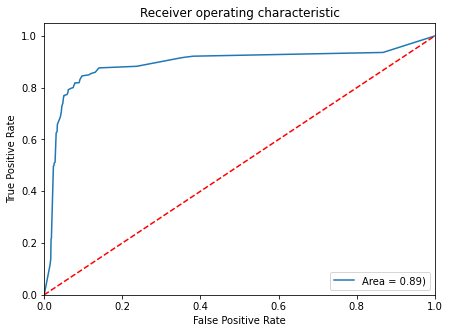

In [79]:
roc_auc_test = roc_auc_score(y_test, dtree.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, dtree.predict_proba(X_test)[:,1])
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label='Area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

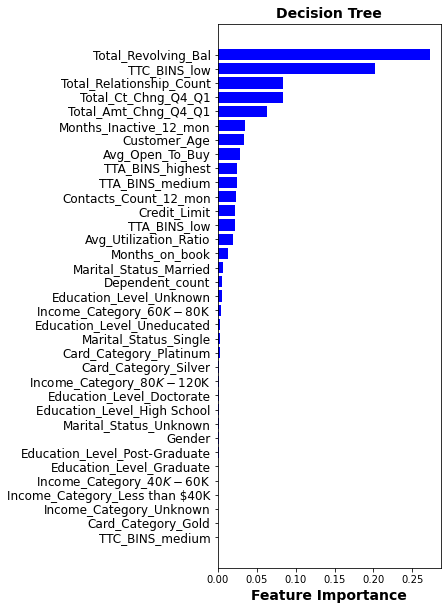

In [80]:
feature_names = X_train.columns
importances = dtree.feature_importances_
indices = np.argsort(importances)
fig=plt.figure(figsize=[4,10]);
plt.title('Decision Tree', fontsize=14, fontweight='bold');
plt.barh(range(len(indices)), importances[indices], align='center', color='Blue');
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize=12);
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold');

- Not a great model
- Top attributes listed above.

### Model 5 - AdaBoost

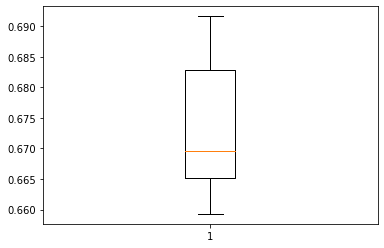

In [81]:
#initialize bagging classifier solver
ab = AdaBoostClassifier(random_state=42)
ab.fit(X_train, y_train)

#CV code
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv=cross_val_score(estimator=ab, X=X_train, y=y_train, scoring=scoring, cv=kfold)

#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv)
plt.show()

* Recall is between ~.66 and .68
* Let's check the performance on the test set.

Accuracy on training set :  0.9243365330321852
Accuracy on test set :  0.9206192358366272
Recall on training set :  0.7045855379188712
Recall on test set :  0.7078189300411523
Precision on training set :  0.799
Precision on test set :  0.7765237020316027
ROC-AUC Score on train data: 0.8354020126569146
ROC-AUC Score on test data: 0.8344977003146937


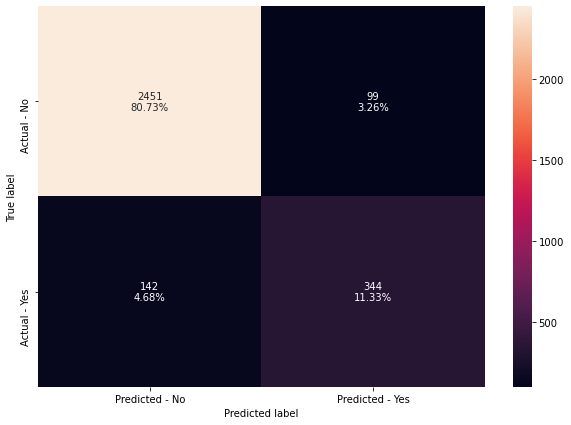

In [82]:
#Calculating different metrics
get_metrics_score(ab)

#Creating confusion matrix
make_confusion_matrix(ab,y_test)

* Model doesn't overfit.
* Recall not as good as earlier models.

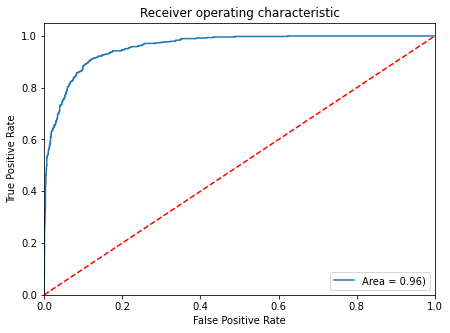

In [83]:
roc_auc_test = roc_auc_score(y_test, ab.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, ab.predict_proba(X_test)[:,1])
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label='Area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

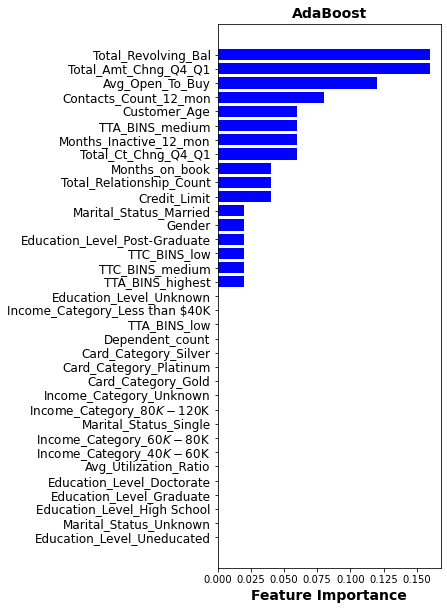

In [84]:
feature_names = X_train.columns
importances = ab.feature_importances_
indices = np.argsort(importances)
fig=plt.figure(figsize=[4,10]);
plt.title('AdaBoost', fontsize=14, fontweight='bold');
plt.barh(range(len(indices)), importances[indices], align='center', color='Blue');
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize=12);
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold');

- Top features can be found in the chart above.

## Gradient Boosting

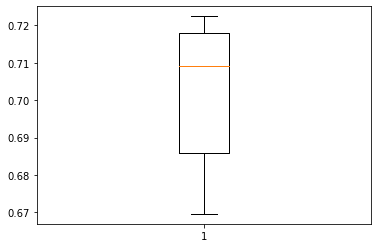

In [85]:
#initialize bagging classifier solver
gb = GradientBoostingClassifier(random_state=42)
gb.fit(X_train, y_train)

#CV code
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv=cross_val_score(estimator=gb, X=X_train, y=y_train, scoring=scoring, cv=kfold)

#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv)
plt.show()

* Recall is between ~.685 and .672
* Let's check the performance on the test set.

Accuracy on training set :  0.9466403162055336
Accuracy on test set :  0.9403820816864296
Recall on training set :  0.7619047619047619
Recall on test set :  0.7304526748971193
Precision on training set :  0.8888888888888888
Precision on test set :  0.8765432098765432
ROC-AUC Score on train data: 0.87187675070028
ROC-AUC Score on test data: 0.8554224158799321


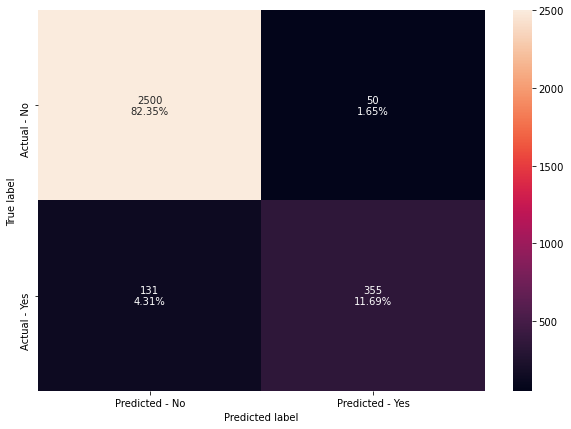

In [86]:
#Calculating different metrics
get_metrics_score(gb)

#Creating confusion matrix
make_confusion_matrix(gb,y_test)

* Model doesn't overfit.
* Recall not as good as earlier models.

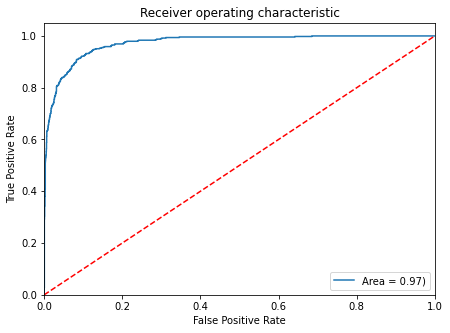

In [87]:
roc_auc_test = roc_auc_score(y_test, gb.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, gb.predict_proba(X_test)[:,1])
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label='Area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

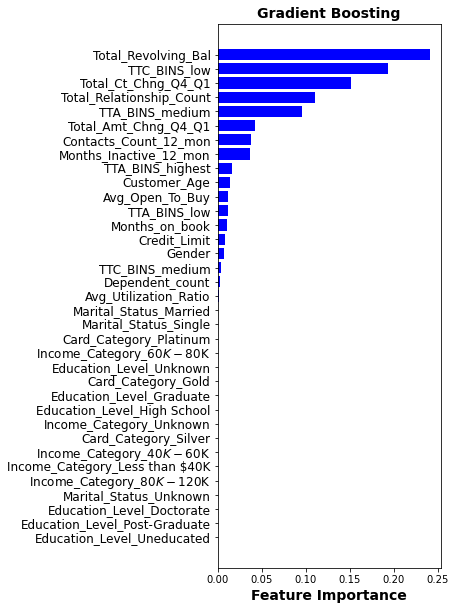

In [88]:
feature_names = X_train.columns
importances = gb.feature_importances_
indices = np.argsort(importances)
fig=plt.figure(figsize=[4,10]);
plt.title('Gradient Boosting', fontsize=14, fontweight='bold');
plt.barh(range(len(indices)), importances[indices], align='center', color='Blue');
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize=12);
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold');

- Top performing features listed above.

## XGBoost

[23:05:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:05:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:05:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:05:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

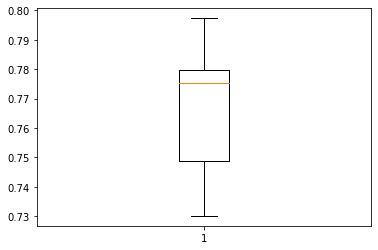

In [89]:
#initialize bagging classifier solver
xgb = XGBClassifier(random_state=42)
xgb.fit(X_train, y_train)

#CV code
scoring='recall'
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)     #Setting number of splits equal to 5
cv=cross_val_score(estimator=xgb, X=X_train, y=y_train, scoring=scoring, cv=kfold)

#Plotting boxplots for CV scores of model defined above
plt.boxplot(cv)
plt.show()

* Recall is between ~.75 and .78
* Let's check the performance on the test set.

Accuracy on training set :  0.9998588368153586
Accuracy on test set :  0.9472990777338604
Recall on training set :  0.9991181657848325
Recall on test set :  0.7839506172839507
Precision on training set :  1.0
Precision on test set :  0.8738532110091743
ROC-AUC Score on train data: 0.9995590828924162
ROC-AUC Score on test data: 0.881190994916485


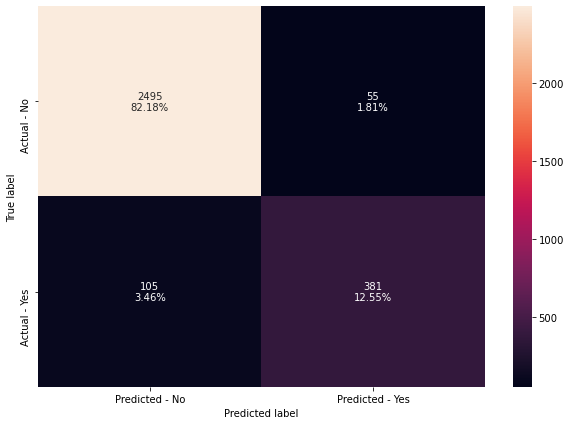

In [90]:
#Calculating different metrics
get_metrics_score(xgb)

#Creating confusion matrix
make_confusion_matrix(xgb,y_test)

* Model overfits.
* Recall not as good as earlier models.

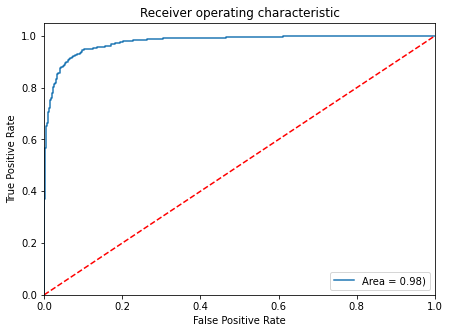

In [91]:
roc_auc_test = roc_auc_score(y_test, xgb.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test,xgb.predict_proba(X_test)[:,1])
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label='Area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

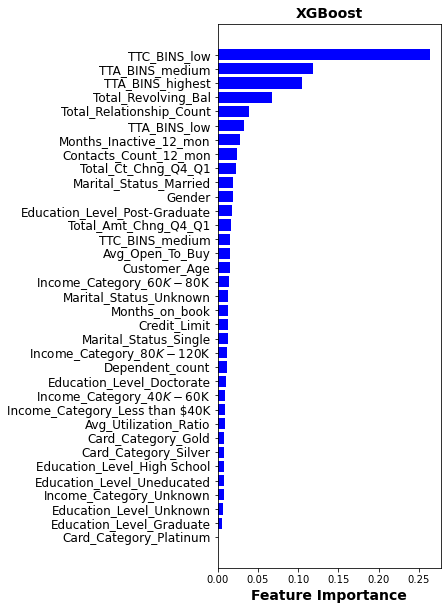

In [92]:
feature_names = X_train.columns
importances = xgb.feature_importances_
indices = np.argsort(importances)
fig=plt.figure(figsize=[4,10]);
plt.title('XGBoost', fontsize=14, fontweight='bold');
plt.barh(range(len(indices)), importances[indices], align='center', color='Blue');
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize=12);
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold');

- Top performing features listed above.

## Aggregate Output

In [98]:
# defining list of model
models = [bc]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.9929418407679277
Accuracy on test set :  0.930171277997365
Recall on training set :  0.9620811287477954
Recall on test set :  0.7098765432098766
Precision on training set :  0.9936247723132969
Precision on test set :  0.8293269230769231
ROC-AUC Score on train data: 0.9804523290797801
ROC-AUC Score on test data: 0.8410167029774873


In [99]:
# defining list of model
models = [rf]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  1.0
Accuracy on test set :  0.9357707509881423
Recall on training set :  1.0
Recall on test set :  0.6954732510288066
Precision on training set :  1.0
Precision on test set :  0.8779220779220779
ROC-AUC Score on train data: 1.0
ROC-AUC Score on test data: 0.8385209392398935


In [100]:
# defining list of model
models = [dtree]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.9695087521174478
Accuracy on test set :  0.919631093544137
Recall on training set :  0.890652557319224
Recall on test set :  0.7695473251028807
Precision on training set :  0.9165154264972777
Precision on test set :  0.7391304347826086
ROC-AUC Score on train data: 0.9375951862226372
ROC-AUC Score on test data: 0.8588913096102639


In [101]:
# defining list of model
models = [ab]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.9243365330321852
Accuracy on test set :  0.9206192358366272
Recall on training set :  0.7045855379188712
Recall on test set :  0.7078189300411523
Precision on training set :  0.799
Precision on test set :  0.7765237020316027
ROC-AUC Score on train data: 0.8354020126569146
ROC-AUC Score on test data: 0.8344977003146937


In [102]:
# defining list of model
models = [gb]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.9466403162055336
Accuracy on test set :  0.9403820816864296
Recall on training set :  0.7619047619047619
Recall on test set :  0.7304526748971193
Precision on training set :  0.8888888888888888
Precision on test set :  0.8765432098765432
ROC-AUC Score on train data: 0.87187675070028
ROC-AUC Score on test data: 0.8554224158799321


In [103]:
# defining list of model
models = [xgb]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.9998588368153586
Accuracy on test set :  0.9472990777338604
Recall on training set :  0.9991181657848325
Recall on test set :  0.7839506172839507
Precision on training set :  1.0
Precision on test set :  0.8738532110091743
ROC-AUC Score on train data: 0.9995590828924162
ROC-AUC Score on test data: 0.881190994916485


In [104]:
comparison_frame = pd.DataFrame({'Model':['Logistic Regression','Logistic Regression on Oversampled data',
                                          'Logistic Regression-Regularized (Oversampled data)','Logistic Regression on Undersampled data'
                                          ,'Bagging Classifier', 'Random Forrest', 'Decision Tree w/ Pruning', 'Adaptive Boost'
                                          ,'Gradient Boost Classifier', 'Extreme Gradient Boost Classifier'
                                          ], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_ROC/AUC':roc_auc_train,'Test_ROC/AUC':roc_auc_test}) 

#Sorting models in decreasing order of test recall
comparison_frame.sort_values(by=['Test_Recall'], ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_ROC/AUC,Test_ROC/AUC
3,Logistic Regression on Undersampled data,0.816770,0.811594,0.816578,0.827160,0.459325,0.451685,0.816693,0.817894
1,Logistic Regression on Oversampled data,0.823405,0.812912,0.805996,0.818930,0.469923,0.453303,0.816360,0.815347
9,Extreme Gradient Boost Classifier,0.999859,0.947299,0.999118,0.783951,1.000000,0.873853,0.999559,0.881191
6,Decision Tree w/ Pruning,0.969509,0.919631,0.890653,0.769547,0.916515,0.739130,0.937595,0.858891
2,Logistic Regression-Regularized (Oversampled d...,0.724167,0.729249,0.708995,0.748971,0.331137,0.342105,0.718027,0.737231
8,Gradient Boost Classifier,0.946640,0.940382,0.761905,0.730453,0.888889,0.876543,0.871877,0.855422
4,Bagging Classifier,0.992942,0.930171,0.962081,0.709877,0.993625,0.829327,0.980452,0.841017
7,Adaptive Boost,0.924337,0.920619,0.704586,0.707819,0.799000,0.776524,0.835402,0.834498
5,Random Forrest,1.000000,0.935771,1.000000,0.695473,1.000000,0.877922,1.000000,0.838521
0,Logistic Regression,0.899351,0.900198,0.561728,0.592593,0.746776,0.732824,0.762713,0.775708


- Top 3 performing models are logistic regression on undersampled data, lr on oversampled data, and XGB.
- Going to tune these models

## Grid Search Hyperparameter Tuning

### Model 8 - Tuned Logisitic Regression w/ Under Sampling

In [105]:
log_reg_under_tuned = LogisticRegression()
grid_values = {'penalty': ['l1', 'l2'],'C':[0.001,.009,0.01,.09,1,5,10,25]}
lrut = GridSearchCV(log_reg_under_tuned, param_grid = grid_values,scoring = 'recall')
lrut.fit(X_train_un, y_train_un)

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.009, 0.01, 0.09, 1, 5, 10, 25],
                         'penalty': ['l1', 'l2']},
             scoring='recall')

Accuracy on training set :  0.8165784832451499
Accuracy on test set :  0.8271604938271605
Recall on training set :  0.8165784832451499
Recall on test set :  0.8271604938271605
Precision on training set :  0.4593253968253968
Precision on test set :  0.451685393258427
ROC-AUC Score on train data: 0.8166926029671128
ROC-AUC Score on test data: 0.8178939724037764


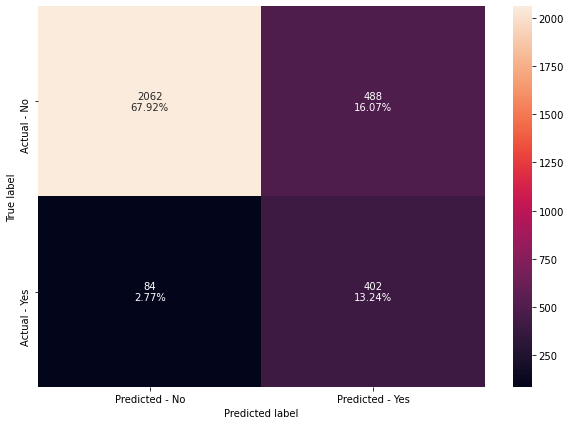

In [106]:
#Calculating different metrics
get_metrics_score(lrut)

#Creating confusion matrix
make_confusion_matrix(lrut,y_test)

- Generalizes well
- Comparable recall performance

### Model 9 - Tuned Logisitic Regression w/ Over Sampling

In [107]:
log_reg_over_tuned = LogisticRegression()
grid_values = {'penalty': ['l1', 'l2'],'C':[0.001,.009,0.01,.09,1,5,10,25]}
lrot = GridSearchCV(log_reg_over_tuned, param_grid = grid_values,scoring = 'recall')
lrot.fit(X_train_over, y_train_over)

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.009, 0.01, 0.09, 1, 5, 10, 25],
                         'penalty': ['l1', 'l2']},
             scoring='recall')

Accuracy on training set :  0.8059964726631393
Accuracy on test set :  0.8189300411522634
Recall on training set :  0.8059964726631393
Recall on test set :  0.8189300411522634
Precision on training set :  0.4699228791773779
Precision on test set :  0.4533029612756264
ROC-AUC Score on train data: 0.8163595808693848
ROC-AUC Score on test data: 0.8153473735173081


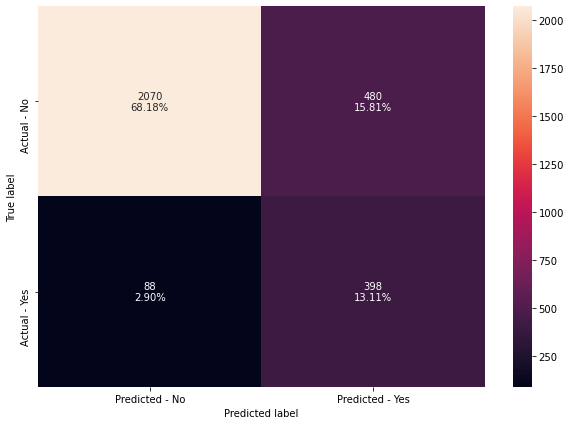

In [108]:
#Calculating different metrics
get_metrics_score(lrot)

#Creating confusion matrix
make_confusion_matrix(lrot,y_test)

- Generalizes well
- Comparable recall performance

### Model 10 - XGBoost Tuned

In [117]:
#parameter grid for CVGridSearch to iterate through to tune hyperparameters
params = {'n_estimators': [75,100,125,150], 
          'subsample':[0.7, 0.8, 0.9, 1],
          'gamma':[0, 1, 3, 5],
          'colsample_bytree':[0.7, 0.8, 0.9, 1],
          'colsample_bylevel':[0.7, 0.8, 0.9, 1]}

#initialize XBBoost classifier solver
Xgbt = XGBClassifier(random_state=42, eval_metric='logloss')

#initialize grid search by inputting model, paramter grid, and # of folds in cross validation
xgbt = GridSearchCV(Xgbt, params, cv=5)

Accuracy on training set :  0.9785431959345002
Accuracy on test set :  0.9463109354413702
Recall on training set :  0.908289241622575
Recall on test set :  0.7818930041152263
Precision on training set :  0.9554730983302412
Precision on test set :  0.8695652173913043
ROC-AUC Score on train data: 0.9501110073659094
ROC-AUC Score on test data: 0.8797700314693779


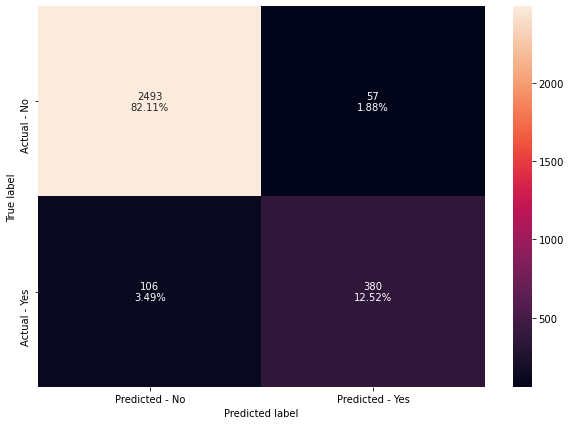

In [118]:
#Fit the model to the training data
xgbt.fit(X_train, y_train)
Xgboost = xgbt.best_estimator_

#Calculating different metrics
get_metrics_score(xgbt)

#Creating confusion matrix
make_confusion_matrix(xgbt,y_test)

## Random Search Hyperparameter Tuning

### Model 11 - Tuned Logisitic Regression w/ Under Sampling

In [109]:
# Create first pipeline for base without reducing features.

pipe = Pipeline([('classifier' , LogisticRegression())])
# pipe = Pipeline([('classifier', RandomForestClassifier())])

# Create param grid.

param_grid = [
    {'classifier' : [LogisticRegression()],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : np.logspace(-4, 4, 20),
    'classifier__solver' : ['liblinear']}
]

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Create grid search object

clf = RandomizedSearchCV(pipe, param_distributions = param_grid, cv = 5, verbose=True, n_jobs=-1, scoring=scorer)

# Fit on data

lrut_r = clf.fit(X_train_un, y_train_un)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


Accuracy on training set :  0.8615520282186949
Accuracy on test set :  0.8786008230452675
Recall on training set :  0.8615520282186949
Recall on test set :  0.8786008230452675
Precision on training set :  0.4885
Precision on test set :  0.4936416184971098
ROC-AUC Score on train data: 0.8448096275547257
ROC-AUC Score on test data: 0.8534180585814573


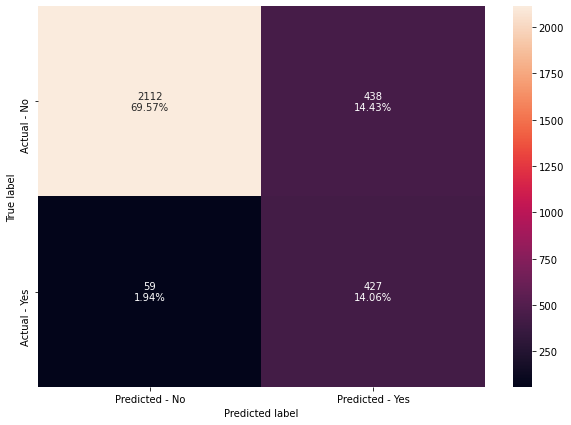

In [110]:
#Calculating different metrics
get_metrics_score(lrut_r)

#Creating confusion matrix
make_confusion_matrix(lrut_r,y_test)

- Model generalizes well
- Model improved with randomized search cv

### Model 12 - Tuned Logisitic Regression w/ Over Sampling

In [111]:
# Create first pipeline for base without reducing features.

pipe = Pipeline([('classifier' , LogisticRegression())])
# pipe = Pipeline([('classifier', RandomForestClassifier())])

# Create param grid.

param_grid = [
    {'classifier' : [LogisticRegression()],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : np.logspace(-4, 4, 20),
    'classifier__solver' : ['liblinear']}
]

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Create grid search object

clf = RandomizedSearchCV(pipe, param_distributions = param_grid, cv = 5, verbose=True, n_jobs=-1, scoring=scorer)

# Fit on data

lrot_r = clf.fit(X_train_over, y_train_over)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


Accuracy on training set :  0.8536155202821869
Accuracy on test set :  0.8641975308641975
Recall on training set :  0.8536155202821869
Recall on test set :  0.8641975308641975
Precision on training set :  0.5007759958613555
Precision on test set :  0.5017921146953405
ROC-AUC Score on train data: 0.8457153231663036
ROC-AUC Score on test data: 0.8503340595497457


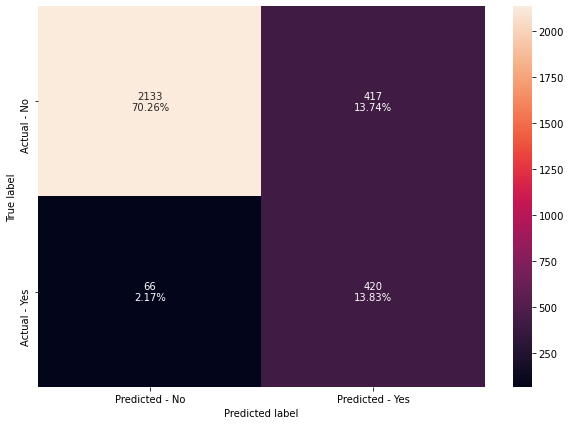

In [112]:
#Calculating different metrics
get_metrics_score(lrot_r)

#Creating confusion matrix
make_confusion_matrix(lrot_r,y_test)

- Model generalizes well
- Model improved with randomized search cv

### Model 13 - XGBoost Tuned

In [120]:
#Creating pipeline
pipe=make_pipeline(StandardScaler(),XGBClassifier(random_state=1))

#Parameter grid to pass in RandomizedSearchCV
param_grid={'xgbclassifier__n_estimators':np.arange(50,300,50),'xgbclassifier__scale_pos_weight':[0,1,2,5,10],
            'xgbclassifier__learning_rate':[0.01,0.1,0.2,0.05], 'xgbclassifier__gamma':[0,1,3,5],
            'xgbclassifier__subsample':[0.7,0.8,0.9,1]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

[23:56:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:56:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:56:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:56:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:57:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:57:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:57:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:57:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:57:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:58:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:58:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:58:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:58:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[23:58:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:58:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [121]:
# Creating new pipeline with best parameters
xgb_tuned2 = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        (
            "XGB",
            XGBClassifier(
                random_state=1,
                n_estimators=20,
                scale_pos_weight=10,
                learning_rate=0.01,
                gamma=1,
                subsample=0.9,
            ),
        ),
    ]
)
# Fit the model on training data
xgb_tuned2.fit(X_train, y_train)

[23:58:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Pipeline(steps=[('scaler', StandardScaler()),
                ('XGB',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=1, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='', learning_rate=0.01,
                               max_delta_step=0, max_depth=6,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=20,
                               n_jobs=8, num_parallel_tree=1, random_state=1,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=10,
                               subsample=0.9, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

Accuracy on training set :  0.7960191981931113
Accuracy on test set :  0.7816205533596838
Recall on training set :  0.9479717813051146
Recall on test set :  0.9382716049382716
Precision on training set :  0.4368143031288094
Precision on test set :  0.418732782369146
ROC-AUC Score on train data: 0.8575153024172633
ROC-AUC Score on test data: 0.8450181554103122


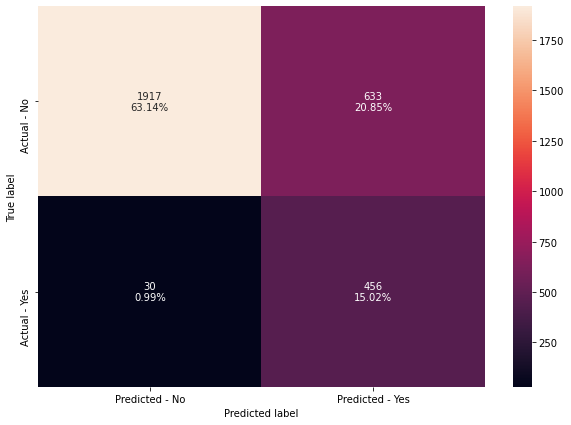

In [122]:
# Calculating different metrics
get_metrics_score(xgb_tuned2)

# Creating confusion matrix
make_confusion_matrix(xgb_tuned2, y_test)

In [113]:
# defining list of model
models = [lrut]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8165784832451499
Accuracy on test set :  0.8271604938271605
Recall on training set :  0.8165784832451499
Recall on test set :  0.8271604938271605
Precision on training set :  0.4593253968253968
Precision on test set :  0.451685393258427
ROC-AUC Score on train data: 0.8166926029671128
ROC-AUC Score on test data: 0.8178939724037764


In [114]:
# defining list of model
models = [lrot]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8059964726631393
Accuracy on test set :  0.8189300411522634
Recall on training set :  0.8059964726631393
Recall on test set :  0.8189300411522634
Precision on training set :  0.4699228791773779
Precision on test set :  0.4533029612756264
ROC-AUC Score on train data: 0.8163595808693848
ROC-AUC Score on test data: 0.8153473735173081


In [119]:
# defining list of model
models = [xgbt]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.9785431959345002
Accuracy on test set :  0.9463109354413702
Recall on training set :  0.908289241622575
Recall on test set :  0.7818930041152263
Precision on training set :  0.9554730983302412
Precision on test set :  0.8695652173913043
ROC-AUC Score on train data: 0.9501110073659094
ROC-AUC Score on test data: 0.8797700314693779


In [115]:
# defining list of model
models = [lrut_r]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8615520282186949
Accuracy on test set :  0.8786008230452675
Recall on training set :  0.8615520282186949
Recall on test set :  0.8786008230452675
Precision on training set :  0.4885
Precision on test set :  0.4936416184971098
ROC-AUC Score on train data: 0.8448096275547257
ROC-AUC Score on test data: 0.8534180585814573


In [116]:
# defining list of model
models = [lrot_r]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.8536155202821869
Accuracy on test set :  0.8641975308641975
Recall on training set :  0.8536155202821869
Recall on test set :  0.8641975308641975
Precision on training set :  0.5007759958613555
Precision on test set :  0.5017921146953405
ROC-AUC Score on train data: 0.8457153231663036
ROC-AUC Score on test data: 0.8503340595497457


In [124]:
# defining list of model
models = [xgb_tuned2]

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    roc_auc_train.append(j[6])
    roc_auc_test.append(j[7])

Accuracy on training set :  0.7960191981931113
Accuracy on test set :  0.7816205533596838
Recall on training set :  0.9479717813051146
Recall on test set :  0.9382716049382716
Precision on training set :  0.4368143031288094
Precision on test set :  0.418732782369146
ROC-AUC Score on train data: 0.8575153024172633
ROC-AUC Score on test data: 0.8450181554103122


In [129]:
print(j)

[0.7960191981931113, 0.7816205533596838, 0.9479717813051146, 0.9382716049382716, 0.4368143031288094, 0.418732782369146, 0.8575153024172633, 0.8450181554103122]


In [130]:
comparison_frame = pd.DataFrame({'Model':['Logistic Regression','Logistic Regression on Oversampled data',
                                          'Logistic Regression-Regularized (Oversampled data)','Logistic Regression on Undersampled data'
                                          ,'Bagging Classifier', 'Random Forrest', 'Decision Tree w/ Pruning', 'Adaptive Boost'
                                          ,'Gradient Boost Classifier', 'Extreme Gradient Boost Classifier'
                                          , 'LR Undersampled - GS Tuned', 'LR Oversampled - GS Tuned', 'LR Undersampled - RS Tuned'
                                          , 'LR Oversampled - RS Tuned','XGB - GS Tuned', 'XGB - RS Tuned'
                                          ], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_ROC/AUC':roc_auc_train,'Test_ROC/AUC':roc_auc_test}) 

#Sorting models in decreasing order of test recall
comparison_frame.sort_values(by=['Test_Recall'], ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_ROC/AUC,Test_ROC/AUC
15,XGB - RS Tuned,0.796019,0.781621,0.947972,0.938272,0.436814,0.418733,0.857515,0.845018
12,LR Undersampled - RS Tuned,0.861552,0.878601,0.861552,0.878601,0.488500,0.493642,0.844810,0.853418
13,LR Oversampled - RS Tuned,0.853616,0.864198,0.853616,0.864198,0.500776,0.501792,0.845715,0.850334
3,Logistic Regression on Undersampled data,0.816770,0.811594,0.816578,0.827160,0.459325,0.451685,0.816693,0.817894
10,LR Undersampled - GS Tuned,0.816578,0.827160,0.816578,0.827160,0.459325,0.451685,0.816693,0.817894
1,Logistic Regression on Oversampled data,0.823405,0.812912,0.805996,0.818930,0.469923,0.453303,0.816360,0.815347
11,LR Oversampled - GS Tuned,0.805996,0.818930,0.805996,0.818930,0.469923,0.453303,0.816360,0.815347
9,Extreme Gradient Boost Classifier,0.999859,0.947299,0.999118,0.783951,1.000000,0.873853,0.999559,0.881191
14,XGB - GS Tuned,0.978543,0.946311,0.908289,0.781893,0.955473,0.869565,0.950111,0.879770
6,Decision Tree w/ Pruning,0.969509,0.919631,0.890653,0.769547,0.916515,0.739130,0.937595,0.858891


<font color=darkblue>

<span style="font-family: Arial; font-weight:bold;font-size:1.25em;color:#0e92ea"> Summary

Overall interesting model results - we definitely saw the impact of over and under-sampling the data as well as hyper parameter tuning and the use of pipelines.  We end up with a very strong model based on recall with XGBoost and randomized search CV.  Many models performed well, however this outperformed all others.
    
The organizations now has a great model for predicting which customers are at risk of churn.